<a href="https://colab.research.google.com/github/Ikeda33/codespaces-railstutorial/blob/main/selfattention3_50epoch_flower_D_sa_G_sa_FID_KID_devide_1_color_relativistic1_hinge.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
#パッケージのダウンロード


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import argparse

In [4]:
import torch
import torch.nn as nn
import torch.optim as optim

In [5]:
import torchvision.transforms as transforms

In [6]:
import torchvision.datasets as dset

In [7]:
import torchvision.utils as vutils

In [8]:
import matplotlib.pyplot as plt
import numpy as np
import tqdm

In [9]:
import glob

In [10]:
from torch.utils.data import Dataset
from PIL import Image

In [11]:
from torch.utils.data import DataLoader
import torchvision

In [12]:
!pip install torchmetrics
!pip install torchmetrics[image]

!pip install torch-fidelity

from torchmetrics.image.inception import InceptionScore


import torchmetrics
import torch_fidelity

import torch
_ = torch.manual_seed(123)
from torchmetrics.image.fid import FrechetInceptionDistance
fid = FrechetInceptionDistance(feature=2048)

from torchmetrics.image.kid import KernelInceptionDistance


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 806.1/806.1 kB 12.4 MB/s eta 0:00:00


Downloading: "https://github.com/toshas/torch-fidelity/releases/download/v0.2.0/weights-inception-2015-12-05-6726825d.pth" to /root/.cache/torch/hub/checkpoints/weights-inception-2015-12-05-6726825d.pth
100%|██████████| 91.2M/91.2M [00:00<00:00, 330MB/s]


In [13]:
kid = KernelInceptionDistance(subset_size=15)

/usr/local/lib/python3.10/dist-packages/torchmetrics/utilities/prints.py:43: UserWarning: Metric `Kernel Inception Distance` will save all extracted features in buffer. For large datasets this may lead to large memory footprint.
  warnings.warn(*args, **kwargs)  # noqa: B028


In [14]:
#ハイパーパラメータの設定

In [15]:
parser = argparse.ArgumentParser()
parser.add_argument("--n_epoch", type = int, default=50)
parser.add_argument("--batch_size", type = int, default=32)
parser.add_argument("--lr_g", type = float, default=2e-4)
parser.add_argument("--lr_d", type = float, default=3e-4)
parser.add_argument("--nch_g", type = int, default=64)
parser.add_argument("--nch_d", type = int, default=64)
parser.add_argument("--z_dim", type = int, default=100)
parser.add_argument("--beta1", type = float, default=0.5)

opt = parser.parse_args(args=[])
print(opt)

Namespace(n_epoch=50, batch_size=32, lr_g=0.0002, lr_d=0.0003, nch_g=64, nch_d=64, z_dim=100, beta1=0.5)


In [16]:
class ImageDataset(Dataset):
    def __init__(self,  transform = None):
        super().__init__()
        self.file_list = glob.glob("/content/drive/MyDrive/102flowers (2)/jpg/*.jpg")#/content/drive/MyDrive/img_align_celeba.zip
        #self.file_list = glob.glob("/content/drive/MyDrive/cityscapes/cityscapes_data/train/*.jpg" )#/content/drive/MyDrive/cityscapes/cityscapes_data/train
        #self.file_list = glob.glob("/content/drive/MyDrive/Test/**/*.jpg" )#fruits
       # self.file_list = glob.glob("/content/drive/MyDrive/img_align_celeba.zip/jpg/*.jpg")#C:\Users\ikeda\Downloads\img_align_celeba\img_align_celeba
        #self.file_list = glob.glob("/content/drive/MyDrive/–¢Šm”F 758452(1).crdownload/*.jpg")
        self.transform = transform


    def __getitem__(self, index):
        if self.transform is not None:
            img = self.transform(Image.open(self.file_list[index]))
        else:
            img = Image.open(self.file_list[index])
        return img

    def __len__(self):
        return len(self.file_list)

In [17]:
from torchvision.transforms.transforms import CenterCrop

transform = transforms.Compose([

    transforms.Resize(80),
    transforms.CenterCrop(64),
    transforms.ToTensor(),
                               transforms.Normalize((0.5,),(0.5,))])

In [18]:
#dataset = dset.MNIST("./", train = True, download = True,transform = transform)
dataset = ImageDataset(transform = transform)
#dataset = torchvision.datasets.CelebA("./", split = "test", download = True,transform = transform) #Cityscapes
#dataset = torchvision.datasets.Cityscapes("C:\Users\ikeda\Downloads\cityscapes\cityscapes_data\cityscapes_data", split='train', mode='fine', target_type='color')


In [19]:
dataloader = DataLoader(dataset = dataset, batch_size = opt.batch_size,num_workers = 2,  shuffle = True)

In [20]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find("Conv") != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find("BatchNorm") != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)


In [21]:
#モデルの設定

In [22]:
class ResidualBlock(nn.Module):
    def __init__(self, in_channels):
        super().__init__()
        out_channels = in_channels
        self.conv1 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv2 = nn.utils.spectral_norm(nn.Conv2d(out_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv3 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size -> チャネル数だけ変化させること
        self.bn = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU()
        self.se_block_0 = SE(out_channels)
    def shortcut(self, x):
        x = self.conv3(x)
        x = self.bn(x)
        return x

    def forward(self, x):
        identity = x#入力
        x = self.conv1(x)
        x = self.se_block_0(x)
        x = self.bn(x)
        x = self.relu(x)
        x = self.conv2(x)
        x = self.se_block_0(x)
        x = self.bn(x)
        x = x + self.shortcut(identity)
        return x

In [23]:
class ResidualBlock_G(nn.Module):
    def __init__(self, in_channels):
        super().__init__()
        out_channels = in_channels
        self.conv1 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv2 = nn.utils.spectral_norm(nn.ConvTranspose2d(out_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv3 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size -> チャネル数だけ変化させること
        self.bn = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU()
        self.se_block_0 = SE_G(out_channels)
    def shortcut(self, x):
        x = self.conv3(x)
        x = self.bn(x)
        return x

    def forward(self, x):
        identity = x#入力
        x = self.conv1(x)
        x = self.se_block_0(x)
        x = self.bn(x)
        x = self.relu(x)
        x = self.conv2(x)
        x = self.se_block_0(x)
        x = self.bn(x)
        x = x + self.shortcut(identity)
        return x

In [24]:
class ResidualBlock_1(nn.Module):#実質パディングとスペクトラム正規化とインスタンス正規化
  def __init__(self, in_channels):
    super().__init__()
    self.conv_layers = nn.Sequential(
        nn.ReflectionPad2d(1),
        nn.utils.spectral_norm(nn.Conv2d(in_channels, in_channels, 3)),
        nn.InstanceNorm2d(in_channels),
        nn.ReLU(inplace = True),

        nn.ReflectionPad2d(1),
        nn.utils.spectral_norm(nn.Conv2d(in_channels, in_channels, 3)),
        nn.InstanceNorm2d(in_channels),

    )
  def forward(self, x):
    out = self.conv_layers(x)
    out = out + x
    return out

In [25]:
class SelfAttention(nn.Module):
    def __init__(self, in_channels):
        super().__init__()
        n_divide = in_channels
        #out_channels = in_channels // n_divide
        out_channels = 1

        self.fx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#nn.utils.spectral_norm
        self.gx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#
        self.hx_1x1 = (nn.Conv2d(in_channels, in_channels, kernel_size = 1))#
        self.gamma = nn.Parameter(torch.zeros(1))
        self.softmax = nn.Softmax(dim = -2)#規格化するため -2


    def forward(self, x):
        B, C, H, W = x.size()
        #x = nn.LayerNorm([C,H,W])#input.size()[1:]
        fx = self.fx_1x1(x).view(B, -1, H*W).permute(0,2,1)
        gx = self.gx_1x1(x).view(B, -1, H*W)
        hx = self.hx_1x1(x).view(B, -1, H*W)

        s_mtx = torch.bmm(fx, gx)
        attention = self.softmax(s_mtx)

        o =torch.bmm(hx, attention)
        o = o.view(B, -1, H, W)
        out = x + self.gamma * o
        return out

In [26]:
#import torch
#from layers.transformer.ScaledDotProductAttention import ScaledDotProductAttention
#from torch import nn


class MultiHeadAttention(nn.Module):
    def __init__(self, in_channels, h = 8):
        super().__init__()
        d_model = in_channels
        self.d_model = in_channels
        self.h = in_channels
        self.d_k = d_model // h
        self.d_v = d_model // h
        self.fx_1x1 = (nn.Conv2d(in_channels, in_channels//self.h, kernel_size = 1))
        self.gx_1x1 = (nn.Conv2d(in_channels, in_channels//self.h, kernel_size = 1))
        self.hx_1x1 = nn.utils.spectral_norm(nn.Conv2d(in_channels, in_channels, kernel_size = 1))
        self.qkv = nn.utils.spectral_norm(nn.Conv2d(in_channels, 3 * in_channels, kernel_size = 1))

#        self.scaled_dot_product_attention = SelfAttention(self.d_model)

        self.linear = nn.Linear(self.h * self.d_v, d_model)
       # self.fx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#nn.utils.spectral_norm
        #self.gx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#
        #self.hx_1x1 = (nn.Conv2d(in_channels, in_channels, kernel_size = 1))#
        self.gamma = nn.Parameter(torch.zeros(1))
        self.softmax = nn.Softmax(dim = -2)#規格化するため -2

        self.se_block_0 = SE(in_channels)
        self.relu = nn.ReLU()

    def forward(self, x ) -> torch.Tensor:
        B, C, H, W = x.size()
        qkv = self.qkv(x)
        self.q, self.k, self.v = qkv.chunk(3, dim = 1)

        #self.q = self.se_block_0(self.q)
        #self.k = self.se_block_0(self.k)
        #self.v = self.se_block_0(self.v)

        """Scaled dot product attention"""
       # attention_output = self.scaled_dot_product_attention(self.q, self.k, self.v)  # (head*batch_size, seq_len, d_model)
        B, C, H, W = self.q.size()
        #x = nn.LayerNorm([C,H,W])#input.size()[1:]
        fx = self.fx_1x1(self.q).view(B, -1, H*W).permute(0,2,1)
        gx = self.gx_1x1(self.k).view(B, -1, H*W)
        hx = self.hx_1x1(self.v).view(B, -1, H*W)
       # fx = self.q.view(B, -1, H*W).permute(0,2,1)
       # gx = self.k.view(B, -1, H*W)
       # hx = self.v.view(B, -1, H*W)

        s_mtx = torch.bmm(fx, gx)
        attention = self.softmax(s_mtx)

        o =torch.bmm(hx, attention)
        o = o.view(B, -1, H, W)
        out = x + self.gamma * o

        #out = out.repeat(1,self.h*1,1,1)

        #out = torch.chunk(out, self.h, dim=1)
       # out = torch.cat(out, dim=1)

        """Linear after scaled dot product attention"""
        #output = self.linear(out)
        return out


In [27]:

class MultiHeadAttention_G(nn.Module):
    def __init__(self, in_channels, h = 8):
        super().__init__()
        d_model = in_channels
        self.d_model = in_channels
        self.h = in_channels
        self.d_k = d_model // h
        self.d_v = d_model // h
        self.fx_1x1 = (nn.ConvTranspose2d(in_channels, in_channels//self.h, kernel_size = 1))
        self.gx_1x1 = (nn.ConvTranspose2d(in_channels, in_channels//self.h, kernel_size = 1))
        self.hx_1x1 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, in_channels, kernel_size = 1))
        self.qkv = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, 3 * in_channels, kernel_size = 1))

#        self.scaled_dot_product_attention = SelfAttention(self.d_model)

        self.linear = nn.Linear(self.h * self.d_v, d_model)
       # self.fx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#nn.utils.spectral_norm
        #self.gx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#
        #self.hx_1x1 = (nn.Conv2d(in_channels, in_channels, kernel_size = 1))#
        self.gamma = nn.Parameter(torch.zeros(1))
        self.softmax = nn.Softmax(dim = -2)#規格化するため -2

        self.se_block_0 = SE_G(in_channels)
        self.relu = nn.ReLU()

    def forward(self, x ) -> torch.Tensor:
        B, C, H, W = x.size()
        qkv = self.qkv(x)
        qkv = self.relu(qkv)
        self.q, self.k, self.v = qkv.chunk(3, dim = 1)

        #self.q = self.se_block_0(self.q)
        #self.k = self.se_block_0(self.k)
        #self.v = self.se_block_0(self.v)
        """Scaled dot product attention"""
       # attention_output = self.scaled_dot_product_attention(self.q, self.k, self.v)  # (head*batch_size, seq_len, d_model)
        B, C, H, W = self.q.size()
        #x = nn.LayerNorm([C,H,W])#input.size()[1:]
        fx = self.fx_1x1(self.q).view(B, -1, H*W).permute(0,2,1)
        gx = self.gx_1x1(self.k).view(B, -1, H*W)
        hx = self.hx_1x1(self.v).view(B, -1, H*W)
       # fx = self.q.view(B, -1, H*W).permute(0,2,1)
       # gx = self.k.view(B, -1, H*W)
       # hx = self.v.view(B, -1, H*W)

        s_mtx = torch.bmm(fx, gx)
        attention = self.softmax(s_mtx)

        o =torch.bmm(hx, attention)
        o = o.view(B, -1, H, W)
        out = x + self.gamma * o

        #out = out.repeat(1,self.h*1,1,1)

        #out = torch.chunk(out, self.h, dim=1)
       # out = torch.cat(out, dim=1)

        """Linear after scaled dot product attention"""
        #output = self.linear(out)
        return out

In [28]:
class SelfAttention_G(nn.Module):
    def __init__(self, in_channels):
        super().__init__()
        n_divide = in_channels
        out_channels = in_channels // n_divide
      #  out_channels = 1

        self.fx_1x1 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels, kernel_size = 1))
        self.gx_1x1 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels, kernel_size = 1))
        self.hx_1x1 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, in_channels, kernel_size = 1))
        self.gamma = nn.Parameter(torch.zeros(1))
        self.softmax = nn.Softmax(dim = -2)#規格化するため -2


    def forward(self, x):
        B, C, H, W = x.size()
        fx = self.fx_1x1(x).view(B, -1, H*W).permute(0,2,1)
        gx = self.gx_1x1(x).view(B, -1, H*W)
        hx = self.hx_1x1(x).view(B, -1, H*W)

        s_mtx = torch.bmm(fx, gx)
        attention = self.softmax(s_mtx)

        o =torch.bmm(hx, attention)
        o = o.view(B, -1, H, W)
        out = x + self.gamma * o
        return out

In [29]:
class PF(nn.Module):#poolformer
    def __init__(self, in_channels , out_channels):
        super().__init__()
        self.conv1 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size=3, padding=1))#kernel_size=4, stride=2, padding=1
        self.conv2 = nn.utils.spectral_norm(nn.Conv2d(out_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv3 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size -> チャネル数だけ変化させること
        self.pre_bn = nn.BatchNorm2d(in_channels)
        self.bn = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU()
        self.pool = nn.AvgPool2d(kernel_size = 3, stride = 1, padding = 3//2, count_include_pad=False)
        self.flat = nn.Flatten()
    def shortcut(self, x):
        x = self.conv3(x)
        x = self.bn(x)
        return x

    def forward(self, x):
        identity = x#入力
        x = self.pre_bn(x)
        x = self.pool(x) -x
        x = x + identity

        identity = x#入力
        x = self.pre_bn(x)
        x= self.flat(x)
        x = self.conv1(x)
        x = self.relu(x)
        x = x + self.shortcut(identity)
        return x

In [30]:
"""    def __init__(self, in_channels):
        super().__init__()
        n_divide = 8
        out_channels = in_channels // n_divide
        self.dim = 3

        self.fx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#nn.utils.spectral_norm
        self.gx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#
        self.hx_1x1 = (nn.Conv2d(in_channels, in_channels, kernel_size = 1))#
        self.gamma = nn.Parameter(torch.zeros(1))
        self.softmax = nn.Softmax(dim = -2)#規格化するため -2
        self.conv1 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size=3, padding=1))#kernel_size=4, stride=2, padding=1
        self.conv2 = nn.utils.spectral_norm(nn.Conv2d(out_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv3 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size==1 -> チャネル数だけ変化させること
        self.pre_bn = nn.BatchNorm2d(in_channels)
        self.bn = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU()
        self.pool= nn.AvgPool2d(kernel_size =self.dim , stride = 1, padding = 0, count_include_pad=False)
        self.sigmoid = nn.Sigmoid()


    def forward(self, x):
        B, C, H, W = x.size()
        z = self.pre_bn(x)
        z = self.pool(z, self.dim = H)

        z = self.conv1(z)
        z = self.relu(z)

        z = self.conv2(z)
        z = self.sigmoid(z)

        z = torch.einsum("bchw,bchw->bchw",(x, z))
        out = x + self.gamma * z
        return out
"""

'    def __init__(self, in_channels):\n        super().__init__()\n        n_divide = 8\n        out_channels = in_channels // n_divide\n        self.dim = 3\n\n        self.fx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#nn.utils.spectral_norm\n        self.gx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#\n        self.hx_1x1 = (nn.Conv2d(in_channels, in_channels, kernel_size = 1))#\n        self.gamma = nn.Parameter(torch.zeros(1))\n        self.softmax = nn.Softmax(dim = -2)#規格化するため -2\n        self.conv1 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size=3, padding=1))#kernel_size=4, stride=2, padding=1\n        self.conv2 = nn.utils.spectral_norm(nn.Conv2d(out_channels, out_channels,kernel_size = 3, padding = 1))\n        self.conv3 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size==1 -> チャネル数だけ変化させること\n        self.pre_bn = nn.BatchNorm2d(in_channels)\n        self.bn = n

In [31]:
class SE(nn.Module):#SE_Block layerに対して作用するattentionのようなモデル
    def __init__(self, in_channels, reduction=24):
        super().__init__()
        channel = in_channels
        reduction = in_channels
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.fc = nn.Sequential(
           # nn.Linear(channel, channel// reduction , bias=False),
            (nn.Conv2d(in_channels, in_channels// reduction,kernel_size = 1, padding = 0)),
            nn.ReLU(inplace=True),
            #nn.Linear(channel // reduction, channel, bias=False),
            (nn.Conv2d(in_channels// reduction,in_channels,kernel_size = 1, padding = 0)),
            nn.Sigmoid()
        )

    def forward(self, x):
        b, c, _, _ = x.size()
        #y = self.avg_pool(x).view(b, c)
        y = self.avg_pool(x)
        y = self.fc(y).view(b, c, 1, 1)
        return x * y.expand_as(x)




In [32]:
class SE_G(nn.Module):#SE_Block layerに対して作用するattentionのようなモデル
    def __init__(self, in_channels, reduction=24):
        super().__init__()
        channel = in_channels
        reduction = in_channels
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.fc = nn.Sequential(
            #nn.Linear(channel, channel// reduction , bias=False),
            nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, in_channels// reduction,kernel_size = 1, padding = 0)),
            nn.ReLU(inplace=True),
            #nn.Linear(channel // reduction, channel, bias=False),
            nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels// reduction,in_channels,kernel_size = 1, padding = 0)),
            nn.Sigmoid()
        )

    def forward(self, x):
        b, c, _, _ = x.size()
        y = self.avg_pool(x)
        y = self.fc(y).view(b, c, 1, 1)
        return x * y.expand_as(x)

In [33]:
#nn.ConvTranspose2d
class PF_G(nn.Module):#poolformer
    def __init__(self, in_channels , out_channels):
        super().__init__()
        self.conv1 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels,kernel_size=3, padding=1))
        self.conv2 = nn.utils.spectral_norm(nn.ConvTranspose2d(out_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv3 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size -> チャネル数だけ変化させること
        self.pre_bn = nn.BatchNorm2d(in_channels)
        self.bn = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU()
        self.pool = nn.AvgPool2d(kernel_size = 3, stride = 1, padding = 3//2, count_include_pad=False)
        self.flat = nn.Flatten()
    def shortcut(self, x):
        x = self.conv3(x)
        x = self.bn(x)
        return x

    def forward(self, x):
        identity = x#入力
        x = self.pre_bn(x)
        x = self.pool(x) - x
        x = x + identity

        identity = x#入力
        x = self.pre_bn(x)
        x = self.flat(x)
        x = self.conv1(x)
        x = self.relu(x)
        x = x + self.shortcut(identity)
        return x

In [34]:
"""(((W - K + 2P)/S) + 1)
    Here W = Input size
    K = Filter size
    S = Stride
    P = Padding
    ((Input_size-kernel_size + 2*Padding)/stride)+ 1
    この式を使用できます[(W−K+2P)/S]+1。

W は入力ボリュームです - あなたの場合は 128
Kはカーネルサイズです - あなたの場合は5です
P はパディングです - あなたの場合は 0 だと思います
S はストライドです - あなたが提供していません。
したがって、次の式に入力します。
for example
Output_Shape = (128-5+0)/1+1

Output_Shape = (124,124,40)
output==1 ,1  = (W - k + 2p)/s = 0   s = 1, p = 0 ,k = W
    """



'(((W - K + 2P)/S) + 1)\n    Here W = Input size\n    K = Filter size\n    S = Stride\n    P = Padding\n    ((Input_size-kernel_size + 2*Padding)/stride)+ 1\n    この式を使用できます[(W−K+2P)/S]+1。\n\nW は入力ボリュームです - あなたの場合は 128\nKはカーネルサイズです - あなたの場合は5です\nP はパディングです - あなたの場合は 0 だと思います\nS はストライドです - あなたが提供していません。\nしたがって、次の式に入力します。\nfor example\nOutput_Shape = (128-5+0)/1+1\n\nOutput_Shape = (124,124,40)\noutput==1 ,1  = (W - k + 2p)/s = 0   s = 1, p = 0 ,k = W\n    '

In [35]:
class VIT(nn.Module):
    def __init__(self, in_channels , out_channels):
        super().__init__()
        self.conv1 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size=3, padding=1))
        self.conv2 = nn.utils.spectral_norm(nn.Conv2d(out_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv3 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size -> チャネル数だけ変化させること
        self.bn = nn.BatchNorm2d(out_channels)
        self.pre_bn = nn.BatchNorm2d(in_channels)

        self.relu = nn.ReLU()
        self.pool = nn.MaxPool2d(kernel_size = 3, stride = 1, padding = 3//2)
        self.attention = SelfAttention(in_channels)
        self.se_block_0 = SE(in_channels)
        self.se_block_1 = SE(out_channels)

        self.flat = nn.Flatten()

        self.linear_1 = nn.Linear(32,64, bias=False)
        self.linear_2 = nn.Linear( 32,32, bias=False)#if ( 64,32, bias=False)  -> mat1 and mat2 shapes cannot be multiplied (131072x32 and 64x32)


    def shortcut(self, x):
        x = self.conv3(x)
        #x = self.se_block_1(x)
        x = self.bn(x)
        return x

    def forward(self, x):

        identity = x#入力
        x = self.pre_bn(x)
        x = self.se_block_0(x)
       # x = self.attention(x) - x
        x = x + identity


        identity = x#入力
        x = self.pre_bn(x)
       # b, c, h, w = x.size()
        x = self.conv1(x)


      #  x = self.linear_1(x).view(b, -1, h, w)
        x = self.relu(x)
       # x = self.linear_2(x).view(b, -1, h, w)


        x =  self.shortcut(identity) + x
        #x = x + self.shortcut(identity)
        x = self.bn(x)

        return x

In [36]:
#nn.ConvTranspose2d
class VIT_G(nn.Module):
    def __init__(self, in_channels , out_channels):
        super().__init__()
        self.conv1 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels,kernel_size=3, padding=1))
        self.conv2 = nn.utils.spectral_norm(nn.ConvTranspose2d(out_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv3 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size=1 -> チャネル数だけ変化させること
        self.bn = nn.BatchNorm2d(out_channels)
        self.pre_bn = nn.BatchNorm2d(in_channels)
        self.relu = nn.ReLU()
        self.pool = nn.AvgPool2d(kernel_size = 3, stride = 1, padding = 3//2, count_include_pad=False)
        self.attention = MultiHeadAttention_G(in_channels)

    def shortcut(self, x):
        x = self.conv3(x)
        x = self.bn(x)
        return x

    def forward(self, x):
        identity = x#入力
        x = self.pre_bn(x)
        x = self.attention(x) - x
        x = x + identity

        #identity = x#入力
        x = self.pre_bn(x)
        x = self.conv1(x)
        x = self.relu(x)
        x = x + self.shortcut(identity)
        return x

In [37]:
class Generator(nn.Module):
    def __init__(self,pf, vit, resnet,res_net,sa,z_dim = opt.z_dim, ngf = opt.nch_g, nc = 3):# ものくろだからnc=1 カラーならnc=3
        super().__init__()

        self.convt1 = self.conv_trans_layers(z_dim, 8*ngf, 4,1,0 )# ngf = the number of channels

        self.convt2 = self.conv_trans_layers(8*ngf, 4*ngf, 4, 2, 1 )
        self.convt3 = self.conv_trans_layers(4*ngf,  2*ngf, 4,2,1)
        self.convt4 = self.conv_trans_layers(2*ngf,  ngf, 4,2,1 )

        self.pf1 = pf(z_dim, 8*ngf)
        self.vit1 = vit(z_dim, 8*ngf)

        self.pf2 = pf(8*ngf, 4*ngf)
        self.vit2 = vit(8*ngf, 4*ngf)

        self.pf3 = pf(4*ngf,  2*ngf)
        self.vit3 = vit(4*ngf,  2*ngf)

        self.pf4 = pf(2*ngf,  ngf)
        self.vit4 = vit(2*ngf,  ngf)

        self.convt5 = nn.Sequential(
            nn.ConvTranspose2d(ngf, nc, 4, 2, 1),
            #self.conv_trans_layers(ngf, nc, 4,2,1  )
            nn.Tanh()
        )


    @staticmethod
    def conv_trans_layers(in_channels, out_channels, kernel_size, stride, padding, has_norm=True,attention=True, res_net= False, se = False):
        layers = [nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding))]#spectralnorm
        if has_norm:
            layers.append(nn.BatchNorm2d(out_channels))
        #layers.append(nn.ReLU(inplace = True))
        layers.append(nn.LeakyReLU(0.2, inplace = True))
        if se:
            layers.append(SE_G(out_channels))
        if attention:
            layers.append(SelfAttention_G(out_channels))
        if res_net:
            layers.append(ResidualBlock_G(out_channels))



        net = nn.Sequential(*layers)#listのアンパック

        return net

    def forward(self, x):
        out = self.convt1(x)

        out = self.convt2(out)

        out = self.convt3(out)

        out = self.convt4(out)

        out = self.convt5(out)


        return out

In [38]:
from pickle import FALSE
class Discriminator(nn.Module):
    def __init__(self,pf,vit ,resnet,res_net,sa,nc = 3, ndf = opt.nch_d):# ものくろだからnc=1 カラーならnc=3
        super().__init__()
        self.conv1 = self.conv_layers(nc, ndf)
        self.pf1 = pf(nc,ndf)
        self.vit1 = vit(nc,ndf)

        self.conv2 = self.conv_layers(ndf, 2*ndf , attention = True)
        self.pf2 = pf(ndf, 2*ndf)
        self.vit2 = vit(ndf, 2*ndf)

        self.conv3 = self.conv_layers(2*ndf, 4*ndf, attention = True )
        self.pf3 = pf(2*ndf, 4*ndf )
        self.vit3 = vit(2*ndf, 4*ndf )

        self.conv4 = self.conv_layers(4*ndf, 8*ndf, attention = True)
        self.pf4 = pf(4*ndf, 8*ndf)
        self.vit4 = vit(4*ndf, 8*ndf)

        self.vit5 = vit(8*ndf, 16*ndf)

        self.conv5 =  nn.Conv2d(8*ndf, 1,  4)
        #self.conv6 =  nn.Conv2d(16*ndf, 1,  4)


    @staticmethod
    def conv_layers(in_channels, out_channels, kernel_size=4, stride=2, padding=1, has_batch_norm = True, attention = False, res_net = False, se = False):
        layers = [nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding))]
        if has_batch_norm:
            layers.append(nn.BatchNorm2d(out_channels))
        layers.append(nn.LeakyReLU(0.2, inplace = True))
        if se:
            layers.append(SE(out_channels))
        if attention:
            layers.append(SelfAttention(out_channels))

        if res_net:
            layers.append(ResidualBlock(out_channels))


        net = nn.Sequential(*layers)#listのアンパック

        return net

    def forward(self, x):
        out = self.conv1(x)

        out = self.conv2(out)

        out = self.conv3(out)

        out = self.conv4(out)

        out = self.conv5(out)

        return out

In [39]:
#モデルのトレーニング

In [40]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


In [41]:
device

device(type='cuda')

In [42]:
netG = Generator(PF_G,VIT_G,ResidualBlock,ResidualBlock_1,SelfAttention, z_dim=opt.z_dim , ngf=opt.nch_g ).to(device)
netG.apply(weights_init)
print(netG)

netD = Discriminator(PF,VIT,ResidualBlock,ResidualBlock_1,SelfAttention, nc = 3 , ndf=opt.nch_d ).to(device)# ものくろだからnc=1 カラーならnc=3
netD.apply(weights_init)
print(netD)

Generator(
  (convt1): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1))
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
    (3): SelfAttention_G(
      (fx_1x1): ConvTranspose2d(512, 1, kernel_size=(1, 1), stride=(1, 1))
      (gx_1x1): ConvTranspose2d(512, 1, kernel_size=(1, 1), stride=(1, 1))
      (hx_1x1): ConvTranspose2d(512, 512, kernel_size=(1, 1), stride=(1, 1))
      (softmax): Softmax(dim=-2)
    )
  )
  (convt2): Sequential(
    (0): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
    (3): SelfAttention_G(
      (fx_1x1): ConvTranspose2d(256, 1, kernel_size=(1, 1), stride=(1, 1))
      (gx_1x1): ConvTranspose2d(256, 1, kernel_size=(1, 1), stride=(1, 1))
      (hx_1x1): ConvTranspo

In [43]:
#criterion = nn.BCELoss()
#criterion = torch.nn.HingeEmbeddingLoss()
optimizerG = optim.Adam(netG.parameters(), lr = opt.lr_g, betas= (opt.beta1, 0.999), weight_decay = 1e-5)
optimizerD = optim.Adam(netD.parameters(), lr = opt.lr_d, betas= (opt.beta1, 0.999), weight_decay = 1e-5)

100%|██████████| 103/103 [01:27<00:00,  1.18it/s]


epoch: 0, lossD:1.2756890885676573, lossG:19.831478313334937,lossG_fake:14.426231807875402, lossG_real:5.405246395219877 ,equality:9.020985412655524


evaluate:218.755126953125,kid_mean:0.18426138162612915, kid_std:0.0260139312595129,kid_:(tensor(0.1843), tensor(0.0260))


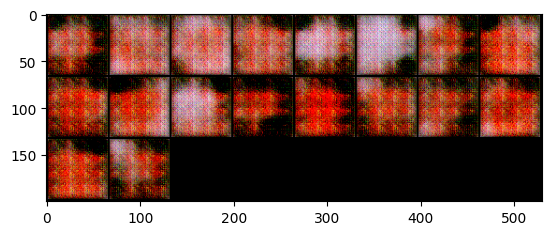

100%|██████████| 103/103 [00:09<00:00, 10.54it/s]


epoch: 1, lossD:0.9273533640266622, lossG:8.819332784819371,lossG_fake:5.181741845260546, lossG_real:3.6375909245129927 ,equality:1.544150920747553


evaluate:150.69329833984375,kid_mean:0.10816705971956253, kid_std:0.03919416666030884,kid_:(tensor(0.1082), tensor(0.0392))


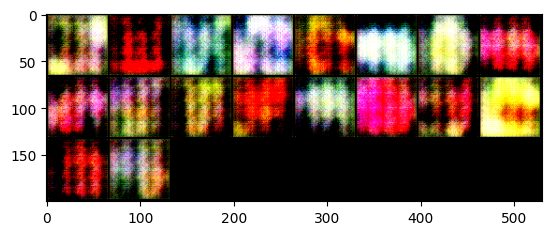

100%|██████████| 103/103 [00:09<00:00, 10.37it/s]


epoch: 2, lossD:1.1731799176885087, lossG:6.965078585356185,lossG_fake:4.012968001724447, lossG_real:2.952110608659902 ,equality:1.0608573930645453


evaluate:138.1278839111328,kid_mean:0.08924384415149689, kid_std:0.0345524437725544,kid_:(tensor(0.0892), tensor(0.0346))


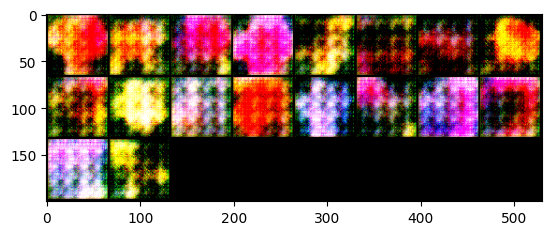

100%|██████████| 103/103 [00:09<00:00, 10.32it/s]


epoch: 3, lossD:1.163360555195114, lossG:7.3183954109265965,lossG_fake:4.366840285004922, lossG_real:2.951555144728966 ,equality:1.4152851402759556


evaluate:145.34849548339844,kid_mean:0.10171803832054138, kid_std:0.040048468858003616,kid_:(tensor(0.1017), tensor(0.0400))


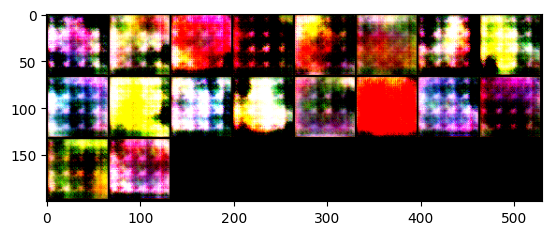

100%|██████████| 103/103 [00:10<00:00, 10.28it/s]


epoch: 4, lossD:1.0655853597863207, lossG:6.743900081486378,lossG_fake:3.976746826495939, lossG_real:2.767153253399053 ,equality:1.2095935730968863


evaluate:141.6813507080078,kid_mean:0.10595499724149704, kid_std:0.049743715673685074,kid_:(tensor(0.1060), tensor(0.0497))


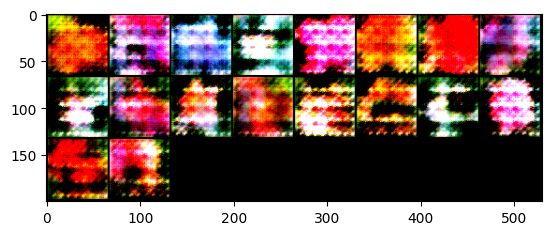

100%|██████████| 103/103 [00:10<00:00, 10.10it/s]


epoch: 5, lossD:1.0765499814042767, lossG:6.7064145190044515,lossG_fake:3.886771975211727, lossG_real:2.819642533376379 ,equality:1.0671294418353479


evaluate:134.2830352783203,kid_mean:0.08950269967317581, kid_std:0.042309727519750595,kid_:(tensor(0.0895), tensor(0.0423))


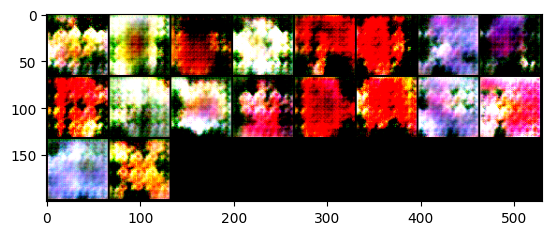

100%|██████████| 103/103 [00:10<00:00, 10.04it/s]


epoch: 6, lossD:1.1086765362799746, lossG:6.639144411364805,lossG_fake:3.9005422823637437, lossG_real:2.7386021182953733 ,equality:1.1619401640683704


evaluate:133.2552490234375,kid_mean:0.09190807491540909, kid_std:0.039648741483688354,kid_:(tensor(0.0919), tensor(0.0396))


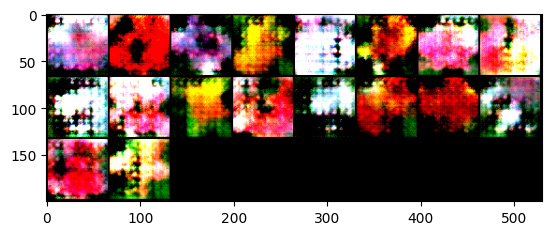

100%|██████████| 103/103 [00:10<00:00,  9.93it/s]


epoch: 7, lossD:1.0323991960692174, lossG:6.854790608859757,lossG_fake:4.0526647776075935, lossG_real:2.8021258335669064 ,equality:1.250538944040687


evaluate:130.7699737548828,kid_mean:0.08289098739624023, kid_std:0.039379216730594635,kid_:(tensor(0.0829), tensor(0.0394))


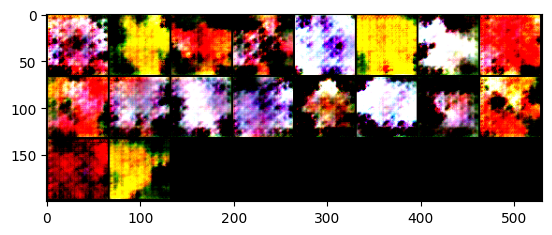

100%|██████████| 103/103 [00:10<00:00, 10.08it/s]


epoch: 8, lossD:0.8281247491396747, lossG:7.014956710408035,lossG_fake:4.053876992568229, lossG_real:2.9610797195758636 ,equality:1.0927972729923656


evaluate:134.09483337402344,kid_mean:0.08020302653312683, kid_std:0.039289917796850204,kid_:(tensor(0.0802), tensor(0.0393))


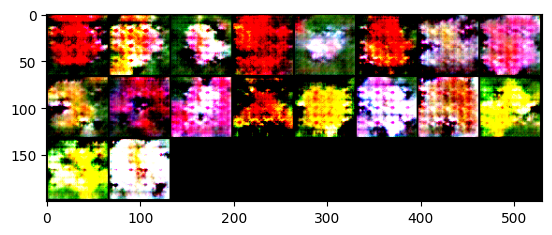

100%|██████████| 103/103 [00:10<00:00, 10.08it/s]


epoch: 9, lossD:0.8676738365761285, lossG:7.378093437083717,lossG_fake:4.312675566349215, lossG_real:3.065417857424727 ,equality:1.2472577089244883


evaluate:134.42471313476562,kid_mean:0.0807136744260788, kid_std:0.04649658873677254,kid_:(tensor(0.0807), tensor(0.0465))


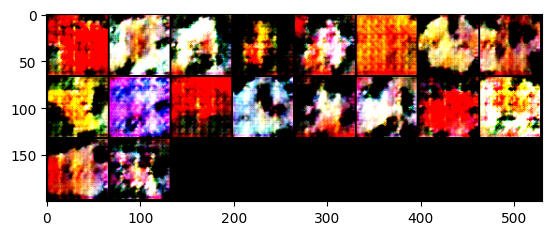

100%|██████████| 103/103 [00:10<00:00, 10.09it/s]


epoch: 10, lossD:0.9338330664102313, lossG:6.887218026281561,lossG_fake:3.8350383587253902, lossG_real:3.0521796513529655 ,equality:0.7828587073724247


evaluate:141.7769317626953,kid_mean:0.09818737953901291, kid_std:0.04578379914164543,kid_:(tensor(0.0982), tensor(0.0458))


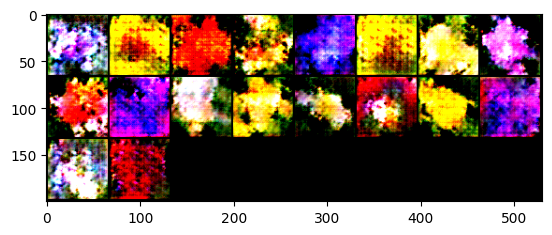

100%|██████████| 103/103 [00:10<00:00, 10.02it/s]


epoch: 11, lossD:0.9903006017642114, lossG:6.593060655501282,lossG_fake:3.6771809059439353, lossG_real:2.915879780517041 ,equality:0.7613011254268942


evaluate:134.2213134765625,kid_mean:0.09216505289077759, kid_std:0.049626316875219345,kid_:(tensor(0.0922), tensor(0.0496))


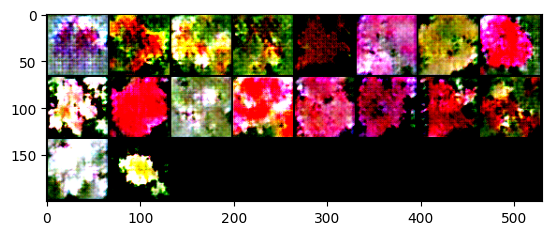

100%|██████████| 103/103 [00:10<00:00,  9.95it/s]


epoch: 12, lossD:1.0692959254227796, lossG:6.304845444207053,lossG_fake:3.4890297697585764, lossG_real:2.8158156993319685 ,equality:0.6732140704266079


evaluate:131.105224609375,kid_mean:0.09082687646150589, kid_std:0.04679619520902634,kid_:(tensor(0.0908), tensor(0.0468))


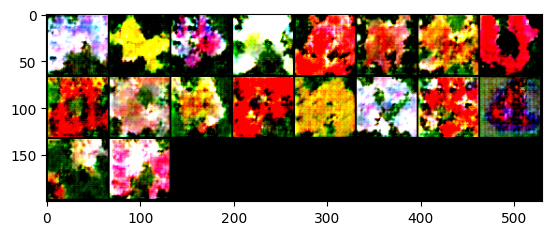

100%|██████████| 103/103 [00:10<00:00, 10.04it/s]


epoch: 13, lossD:0.989329867571303, lossG:6.251289663962948,lossG_fake:3.473325001383291, lossG_real:2.7779646440617087 ,equality:0.6953603573215821


evaluate:127.04769134521484,kid_mean:0.08583995699882507, kid_std:0.04513333737850189,kid_:(tensor(0.0858), tensor(0.0451))


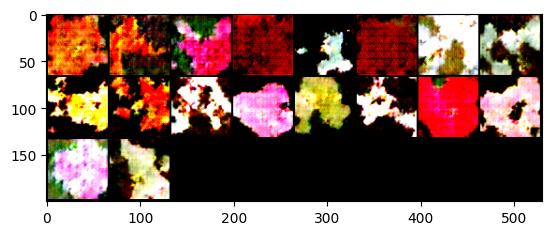

100%|██████████| 103/103 [00:10<00:00, 10.00it/s]


epoch: 14, lossD:0.8826576776585533, lossG:6.507730048837014,lossG_fake:3.6094908586983543, lossG_real:2.898239182037057 ,equality:0.7112516766612971


evaluate:128.66864013671875,kid_mean:0.08566491305828094, kid_std:0.04916226491332054,kid_:(tensor(0.0857), tensor(0.0492))


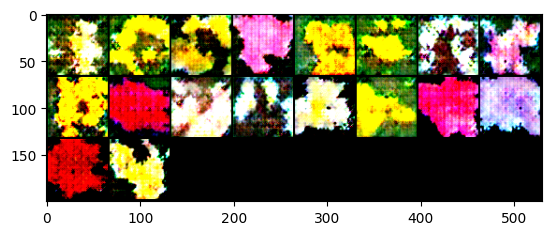

100%|██████████| 103/103 [00:10<00:00,  9.98it/s]


epoch: 15, lossD:0.7805891203359493, lossG:6.791259085090415,lossG_fake:3.658714310347455, lossG_real:3.132544747255381 ,equality:0.5261695630920742


evaluate:126.38887786865234,kid_mean:0.10129336267709732, kid_std:0.048160675913095474,kid_:(tensor(0.1013), tensor(0.0482))


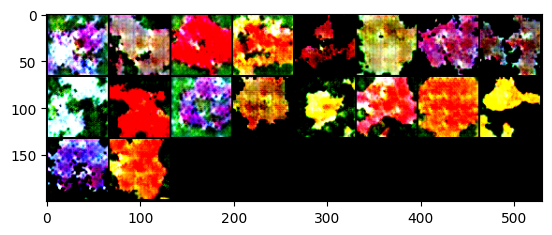

100%|██████████| 103/103 [00:10<00:00,  9.99it/s]


epoch: 16, lossD:0.8944635874438054, lossG:6.632540573194189,lossG_fake:3.6448275765169016, lossG_real:2.9877129787380254 ,equality:0.6571145977788762


evaluate:125.65194702148438,kid_mean:0.08986411988735199, kid_std:0.044960230588912964,kid_:(tensor(0.0899), tensor(0.0450))


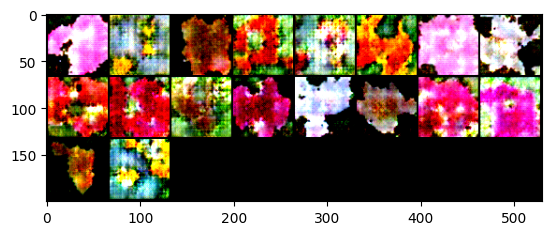

100%|██████████| 103/103 [00:10<00:00,  9.97it/s]


epoch: 17, lossD:0.7285991482508992, lossG:6.859679805422292,lossG_fake:3.6834121091851912, lossG_real:3.176267706074761 ,equality:0.5071444031104302


evaluate:126.73310089111328,kid_mean:0.09480197727680206, kid_std:0.04838835075497627,kid_:(tensor(0.0948), tensor(0.0484))


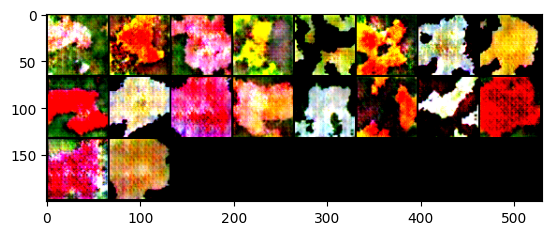

100%|██████████| 103/103 [00:10<00:00, 10.01it/s]


epoch: 18, lossD:0.710508067902286, lossG:7.339471219812782,lossG_fake:3.983927335553956, lossG_real:3.3555438900456847 ,equality:0.6283834455082715


evaluate:128.2122039794922,kid_mean:0.08647602051496506, kid_std:0.045019958168268204,kid_:(tensor(0.0865), tensor(0.0450))


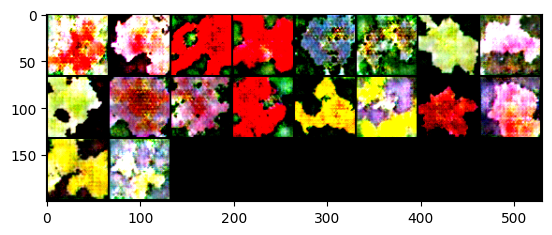

100%|██████████| 103/103 [00:10<00:00, 10.04it/s]


epoch: 19, lossD:0.6349870592934413, lossG:7.381636364946088,lossG_fake:4.012728192273853, lossG_real:3.3689081477887424 ,equality:0.6438200444851105


evaluate:128.75820922851562,kid_mean:0.0850788876414299, kid_std:0.043394193053245544,kid_:(tensor(0.0851), tensor(0.0434))


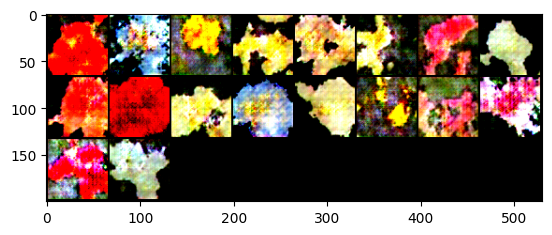

100%|██████████| 103/103 [00:10<00:00, 10.03it/s]


epoch: 20, lossD:0.687703090385326, lossG:7.402075716592734,lossG_fake:3.899381953535728, lossG_real:3.5026937520619734 ,equality:0.3966882014737547


evaluate:129.97116088867188,kid_mean:0.09868723154067993, kid_std:0.051625799387693405,kid_:(tensor(0.0987), tensor(0.0516))


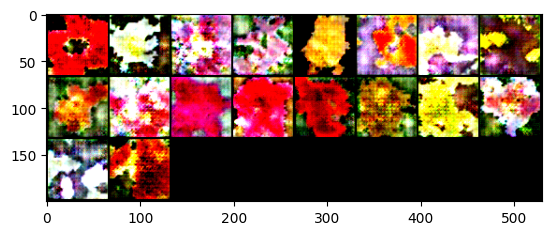

100%|██████████| 103/103 [00:10<00:00,  9.98it/s]


epoch: 21, lossD:0.5569274298738218, lossG:7.712473531371182,lossG_fake:4.139836033571114, lossG_real:3.572637490855837 ,equality:0.5671985427152766


evaluate:126.74746704101562,kid_mean:0.08564300835132599, kid_std:0.0441315621137619,kid_:(tensor(0.0856), tensor(0.0441))


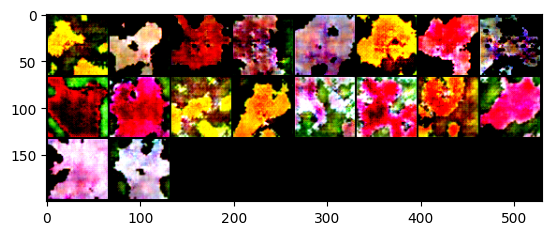

100%|██████████| 103/103 [00:10<00:00,  9.98it/s]


epoch: 22, lossD:0.4962893574887398, lossG:8.022044510517306,lossG_fake:4.290717850611048, lossG_real:3.731326681896321 ,equality:0.5593911687147273


evaluate:127.04102325439453,kid_mean:0.08799971640110016, kid_std:0.047303538769483566,kid_:(tensor(0.0880), tensor(0.0473))


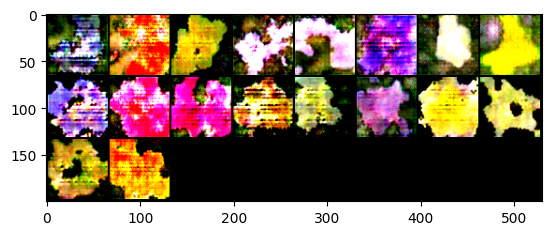

100%|██████████| 103/103 [00:10<00:00,  9.99it/s]


epoch: 23, lossD:0.42305566840669484, lossG:8.25611818183973,lossG_fake:4.39302933910518, lossG_real:3.86308888613599 ,equality:0.5299404529691896


evaluate:127.62937927246094,kid_mean:0.09730604290962219, kid_std:0.0480521135032177,kid_:(tensor(0.0973), tensor(0.0481))


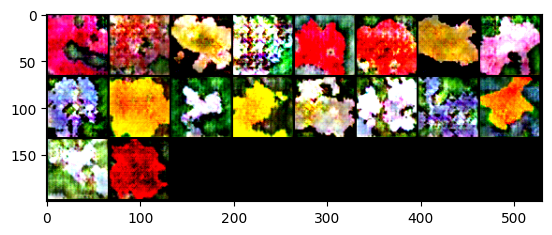

100%|██████████| 103/103 [00:10<00:00, 10.03it/s]


epoch: 24, lossD:0.4088706915058847, lossG:8.704421830408782,lossG_fake:4.689135242434381, lossG_real:4.01528659781206 ,equality:0.6738486446223213


evaluate:128.99903869628906,kid_mean:0.08972711861133575, kid_std:0.04418214410543442,kid_:(tensor(0.0897), tensor(0.0442))


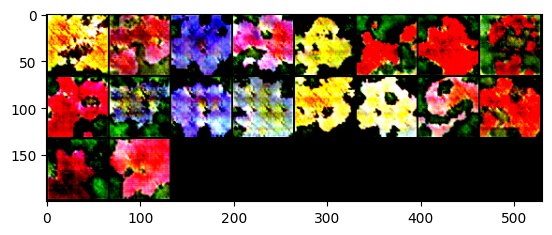

100%|██████████| 103/103 [00:10<00:00, 10.04it/s]


epoch: 25, lossD:0.3599748095153894, lossG:9.124302340942679,lossG_fake:4.805279640318121, lossG_real:4.319022683263983 ,equality:0.4862569570541382


evaluate:127.46522521972656,kid_mean:0.09039270132780075, kid_std:0.051837656646966934,kid_:(tensor(0.0904), tensor(0.0518))


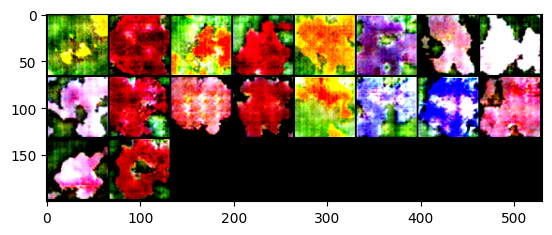

100%|██████████| 103/103 [00:10<00:00,  9.99it/s]


epoch: 26, lossD:0.39086791059201204, lossG:9.015550729140495,lossG_fake:4.740435408157053, lossG_real:4.275115327927673 ,equality:0.46532008022937976


evaluate:124.70809173583984,kid_mean:0.08521680533885956, kid_std:0.04288191348314285,kid_:(tensor(0.0852), tensor(0.0429))


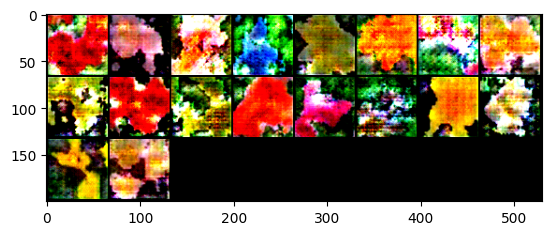

100%|██████████| 103/103 [00:10<00:00, 10.03it/s]


epoch: 27, lossD:0.36679923744166937, lossG:9.088231429312993,lossG_fake:4.8103076740376, lossG_real:4.277923739650874 ,equality:0.5323839343867256


evaluate:125.31515502929688,kid_mean:0.08510599285364151, kid_std:0.03906805440783501,kid_:(tensor(0.0851), tensor(0.0391))


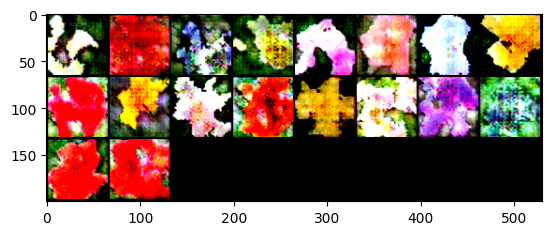

100%|██████████| 103/103 [00:10<00:00,  9.99it/s]


epoch: 28, lossD:0.3476840171022612, lossG:9.112148826562086,lossG_fake:4.765665944340159, lossG_real:4.346482867176093 ,equality:0.41918307716406655


evaluate:126.68587493896484,kid_mean:0.09070322662591934, kid_std:0.04375205934047699,kid_:(tensor(0.0907), tensor(0.0438))


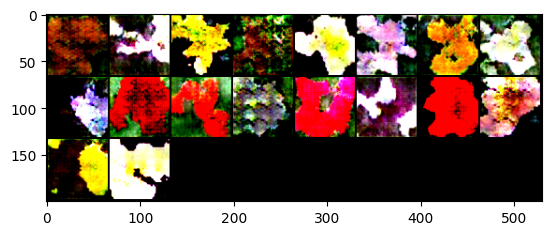

100%|██████████| 103/103 [00:10<00:00, 10.02it/s]


epoch: 29, lossD:0.32175337056656483, lossG:9.414776376150186,lossG_fake:4.872515236289756, lossG_real:4.5422611039819065 ,equality:0.33025413230784917


evaluate:126.21782684326172,kid_mean:0.09358984977006912, kid_std:0.04444972053170204,kid_:(tensor(0.0936), tensor(0.0444))


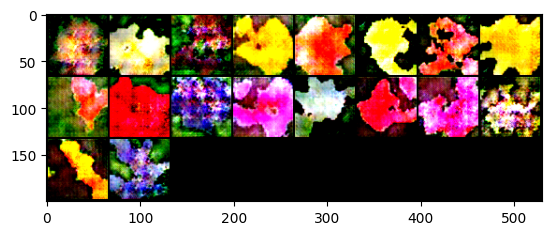

100%|██████████| 103/103 [00:10<00:00, 10.00it/s]


epoch: 30, lossD:0.27329452574542423, lossG:9.758371167969935,lossG_fake:5.095881276917689, lossG_real:4.662489887580131 ,equality:0.43339138933755805


evaluate:126.10526275634766,kid_mean:0.07798120379447937, kid_std:0.04042790085077286,kid_:(tensor(0.0780), tensor(0.0404))


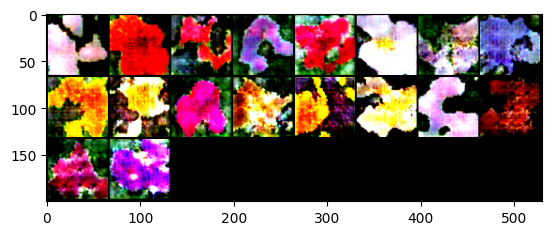

100%|██████████| 103/103 [00:10<00:00, 10.04it/s]


epoch: 31, lossD:0.3533939249198703, lossG:10.18253156050895,lossG_fake:5.429113506113441, lossG_real:4.75341803674559 ,equality:0.6756954693678514


evaluate:125.5744400024414,kid_mean:0.09227371215820312, kid_std:0.04624224454164505,kid_:(tensor(0.0923), tensor(0.0462))


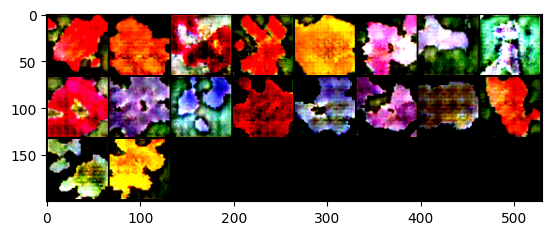

100%|██████████| 103/103 [00:10<00:00, 10.01it/s]


epoch: 32, lossD:0.2660922321301062, lossG:10.122250732866306,lossG_fake:5.326988535019958, lossG_real:4.795262150394106 ,equality:0.531726384625852


evaluate:124.30361938476562,kid_mean:0.08816792815923691, kid_std:0.04175335168838501,kid_:(tensor(0.0882), tensor(0.0418))


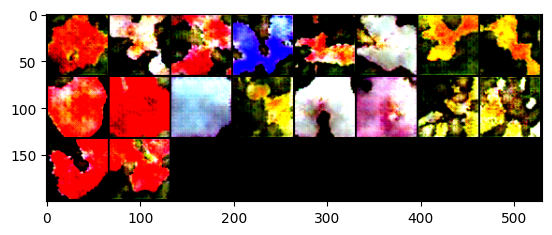

100%|██████████| 103/103 [00:10<00:00,  9.98it/s]


epoch: 33, lossD:0.25777796957895016, lossG:10.439063849958401,lossG_fake:5.430534711161863, lossG_real:5.008529135324423 ,equality:0.42200557583744036


evaluate:123.71300506591797,kid_mean:0.09038234502077103, kid_std:0.043769534677267075,kid_:(tensor(0.0904), tensor(0.0438))


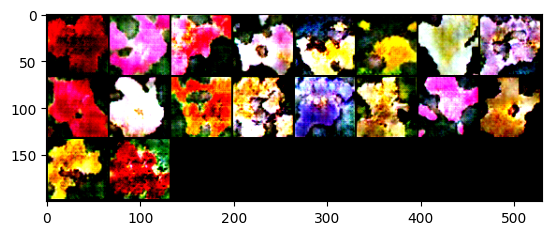

100%|██████████| 103/103 [00:10<00:00, 10.05it/s]


epoch: 34, lossD:0.20252312755989796, lossG:10.43403930108524,lossG_fake:5.398420544503962, lossG_real:5.035618728804357 ,equality:0.3628018156996049


evaluate:122.1834945678711,kid_mean:0.08449169993400574, kid_std:0.051378779113292694,kid_:(tensor(0.0845), tensor(0.0514))


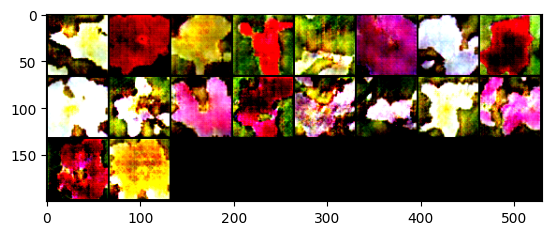

100%|██████████| 103/103 [00:10<00:00, 10.04it/s]


epoch: 35, lossD:0.20284218330261777, lossG:10.36840158295863,lossG_fake:5.498414782644476, lossG_real:4.869986809573128 ,equality:0.6284279730713482


evaluate:122.98699951171875,kid_mean:0.07992294430732727, kid_std:0.04234945774078369,kid_:(tensor(0.0799), tensor(0.0423))


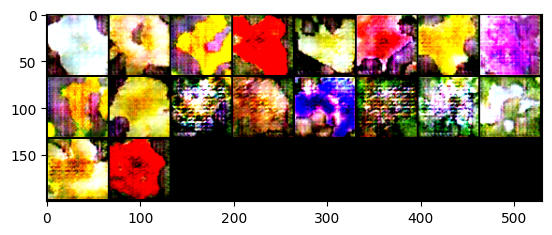

100%|██████████| 103/103 [00:10<00:00, 10.01it/s]


epoch: 36, lossD:0.18506391628563984, lossG:10.708281405921122,lossG_fake:5.696045644074967, lossG_real:5.012235764160897 ,equality:0.6838098799140706


evaluate:122.93732452392578,kid_mean:0.09403050690889359, kid_std:0.05034333094954491,kid_:(tensor(0.0940), tensor(0.0503))


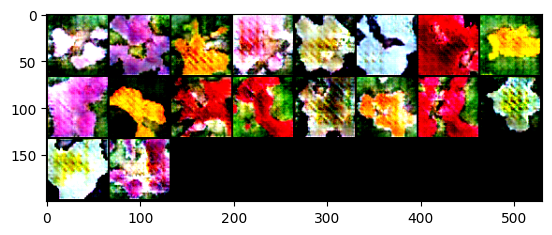

100%|██████████| 103/103 [00:10<00:00, 10.02it/s]


epoch: 37, lossD:0.15253313887611175, lossG:11.031312294376706,lossG_fake:5.762069859550994, lossG_real:5.269242397789816 ,equality:0.49282746176117787


evaluate:122.15831756591797,kid_mean:0.08390500396490097, kid_std:0.042129404842853546,kid_:(tensor(0.0839), tensor(0.0421))


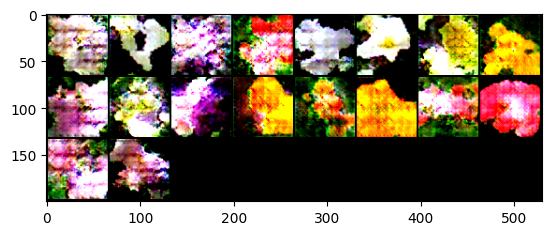

100%|██████████| 103/103 [00:10<00:00, 10.07it/s]


epoch: 38, lossD:0.2005928523874688, lossG:11.268796217094348,lossG_fake:6.009924668710209, lossG_real:5.258871540282536 ,equality:0.7510531284276727


evaluate:120.50289916992188,kid_mean:0.07616624236106873, kid_std:0.03970334678888321,kid_:(tensor(0.0762), tensor(0.0397))


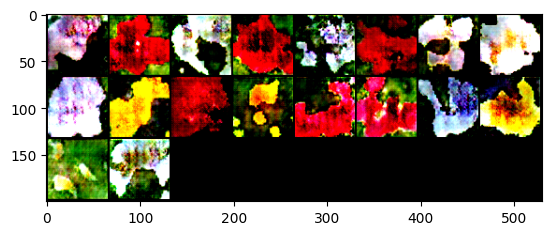

100%|██████████| 103/103 [00:10<00:00, 10.06it/s]


epoch: 39, lossD:0.12192751662534418, lossG:11.264298679759202,lossG_fake:5.8617513712170055, lossG_real:5.402547343263349 ,equality:0.4592040279536569


evaluate:121.76109313964844,kid_mean:0.08312902599573135, kid_std:0.042364396154880524,kid_:(tensor(0.0831), tensor(0.0424))


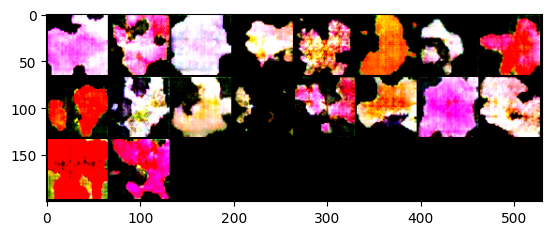

100%|██████████| 103/103 [00:10<00:00, 10.00it/s]


epoch: 40, lossD:0.18959843092462392, lossG:11.226142420352083,lossG_fake:5.861537889369483, lossG_real:5.364604537926831 ,equality:0.49693335144265216


evaluate:121.62245178222656,kid_mean:0.08412547409534454, kid_std:0.03742065280675888,kid_:(tensor(0.0841), tensor(0.0374))


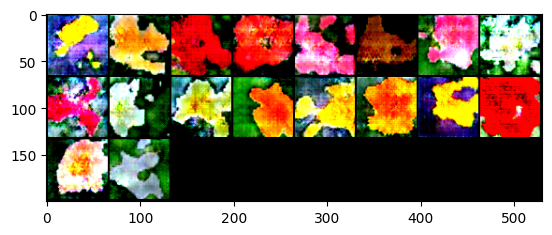

100%|██████████| 103/103 [00:10<00:00, 10.00it/s]


epoch: 41, lossD:0.2840825612249884, lossG:11.319426082870335,lossG_fake:5.882941935826274, lossG_real:5.4364841366277155 ,equality:0.44645779919855855


evaluate:122.29745483398438,kid_mean:0.08174793422222137, kid_std:0.04203270003199577,kid_:(tensor(0.0817), tensor(0.0420))


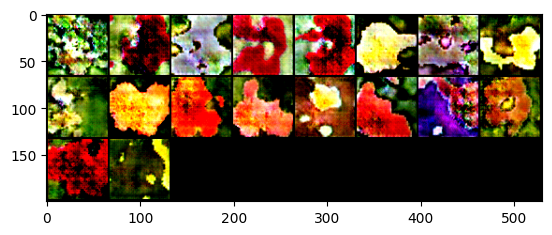

100%|██████████| 103/103 [00:10<00:00, 10.00it/s]


epoch: 42, lossD:0.2089650092592228, lossG:11.291208582017028,lossG_fake:5.877086891711337, lossG_real:5.414121640538706 ,equality:0.46296525117263077


evaluate:121.48665618896484,kid_mean:0.08122587203979492, kid_std:0.04382786899805069,kid_:(tensor(0.0812), tensor(0.0438))


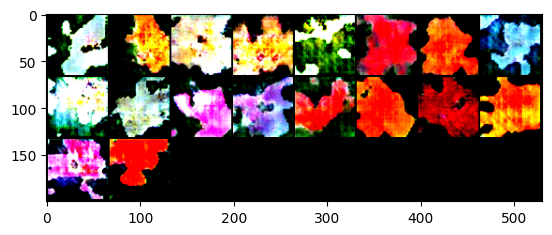

100%|██████████| 103/103 [00:10<00:00,  9.99it/s]


epoch: 43, lossD:0.19409054494236858, lossG:11.851613711384895,lossG_fake:6.308291104233381, lossG_real:5.543322646502152 ,equality:0.7649684577312286


evaluate:123.22590637207031,kid_mean:0.0876220315694809, kid_std:0.04158425331115723,kid_:(tensor(0.0876), tensor(0.0416))


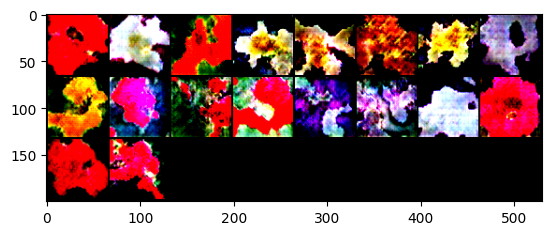

100%|██████████| 103/103 [00:10<00:00, 10.00it/s]


epoch: 44, lossD:0.17961749521274012, lossG:11.70249814894593,lossG_fake:6.1311215764110525, lossG_real:5.571376587580708 ,equality:0.5597449888303441


evaluate:123.04351806640625,kid_mean:0.08194547891616821, kid_std:0.04034680500626564,kid_:(tensor(0.0819), tensor(0.0403))


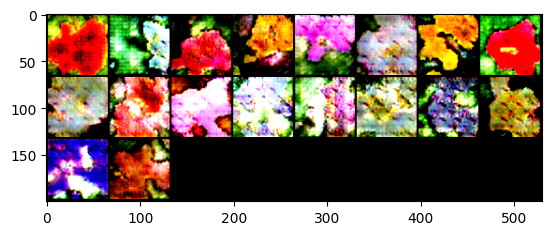

100%|██████████| 103/103 [00:10<00:00, 10.01it/s]


epoch: 45, lossD:0.14675302119943703, lossG:12.047379790000544,lossG_fake:6.343269239351588, lossG_real:5.704110530973638 ,equality:0.6391587083779493


evaluate:124.00109100341797,kid_mean:0.08293469250202179, kid_std:0.04125525802373886,kid_:(tensor(0.0829), tensor(0.0413))


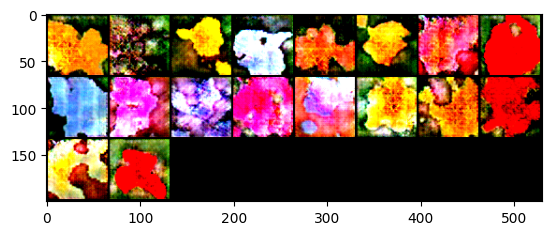

100%|██████████| 103/103 [00:10<00:00, 10.04it/s]


epoch: 46, lossD:0.3012139351441733, lossG:11.831816969565974,lossG_fake:6.116457240167752, lossG_real:5.715359729470559 ,equality:0.401097510697193


evaluate:124.92495727539062,kid_mean:0.08498597890138626, kid_std:0.04668813571333885,kid_:(tensor(0.0850), tensor(0.0467))


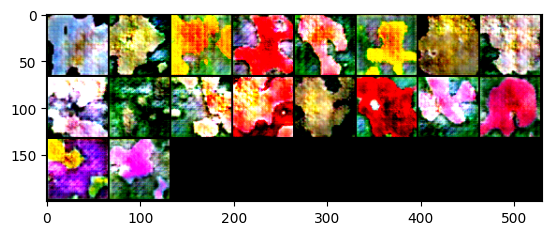

100%|██████████| 103/103 [00:10<00:00,  9.99it/s]


epoch: 47, lossD:0.22340406651057085, lossG:11.402153681782844,lossG_fake:5.947784185409546, lossG_real:5.454369470911119 ,equality:0.4934147144984271


evaluate:125.34152221679688,kid_mean:0.0919175073504448, kid_std:0.04679318889975548,kid_:(tensor(0.0919), tensor(0.0468))


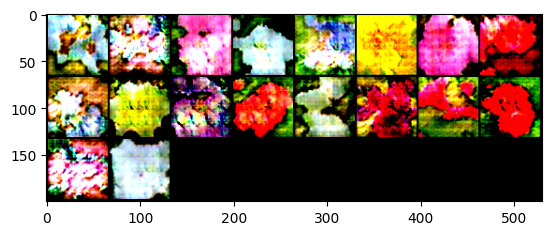

100%|██████████| 103/103 [00:10<00:00, 10.02it/s]


epoch: 48, lossD:0.11974100226048127, lossG:11.373129631709126,lossG_fake:6.041427336850212, lossG_real:5.33170227865571 ,equality:0.7097250581945023


evaluate:125.38334655761719,kid_mean:0.08496229350566864, kid_std:0.038523316383361816,kid_:(tensor(0.0850), tensor(0.0385))


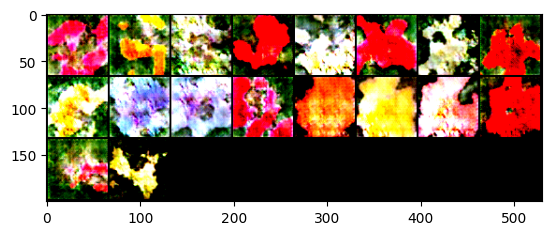

100%|██████████| 103/103 [00:10<00:00, 10.05it/s]


epoch: 49, lossD:0.08521995212412575, lossG:11.196972921056656,lossG_fake:5.906139445536345, lossG_real:5.290833452372875 ,equality:0.6153059931634699


evaluate:125.40547180175781,kid_mean:0.08287442475557327, kid_std:0.05234847590327263,kid_:(tensor(0.0829), tensor(0.0523))


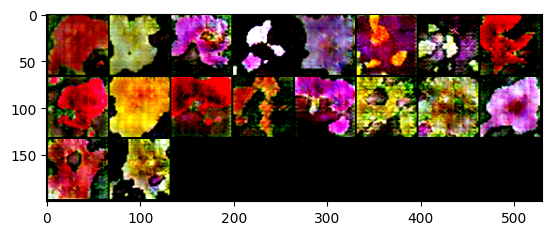

In [44]:
lossesD = []
lossesG = []

raw_lossesD = []
raw_lossesG = []
lossesG_fake = []
lossesG_real = []

equality = 0.0
sum_equality = 0.0
d_equality = []

relu = torch.nn.ReLU()

fid_ = []
kid_mean_ = []
kid_std_ = []
kid_score = []
for epoch in range(opt.n_epoch):
    running_lossD = 0.0 #損失関数初期化
    running_lossG = 0.0
    lossG_fake_running = 0.0
    lossG_real_running = 0.0

    #sum_equality += equality
    equality = 0.0
   # for i , (real_imgs, _) in enumerate(tqdm.tqdm(dataloader, position = 0)):#celebA
    for i , real_imgs in enumerate(tqdm.tqdm(dataloader, position = 0)):#flower
        real_imgs = real_imgs.to(device)
        batch_size = real_imgs.size()[0]
        noise = torch.randn(batch_size, opt.z_dim, 1, 1).to(device)

        #train discriminator

        netD.zero_grad()
        output_real = netD(real_imgs)

        #lossD_real = criterion(output, labels_real)
        lossD_real = torch.mean(relu(1.0 - output_real))


        fake_imgs = netG(noise)##not train  output_fake_d
        output_fake_d = netD(fake_imgs.detach())#not train  output_fake_d

        #lossD_fake = criterion(output, labels_fake)
        lossD_fake = torch.mean(relu(1.0 + output_fake_d))


        lossD = lossD_real + lossD_fake
        #lossD = torch.mean(torch.log(torch.sigmoid(output_real)))- torch.mean(torch.log(torch.sigmoid(output_fake_d)))  #not train  output_fake_d
        lossD.backward()
        optimizerD.step()

        #train generator

        netG.zero_grad()#勾配初期

        output_fake_g = netD(fake_imgs)#train  output_fake_g
        output_real = netD(real_imgs)

        lossG_fake = torch.mean(relu(1.0 - output_fake_g))
        lossG_real = torch.mean(relu(1.0 + output_real))
        #lossG =  torch.mean(torch.log(torch.sigmoid(output_fake_g - output_real))) #- torch.mean(torch.log(torch.sigmoid(output_real)))#train  output_fake_g
        lossG =    lossG_real + lossG_fake


        lossG.backward()
        optimizerG.step()

        # save loss

        running_lossD += lossD.item()
        running_lossG += lossG.item()

        raw_lossesD.append(lossD.item())
        raw_lossesG.append(lossG.item())

        lossG_fake_running += lossG_fake.item()
        lossG_real_running += lossG_real.item()



    running_lossD /=len(dataloader)
    running_lossG /=len(dataloader)

    lossG_fake_running /= len(dataloader)
    lossG_real_running /= len(dataloader)
#equality
    equality = ( lossG_fake_running - lossG_real_running  )
    d_equality.append(equality)


    print("epoch: {}, lossD:{}, lossG:{},lossG_fake:{}, lossG_real:{} ,equality:{}".format(epoch, running_lossD, running_lossG,lossG_fake_running,lossG_real_running,equality))#-->,lossG_fake:{}, lossG_real:{},lossG_fake_running,lossG_real_running
    lossesD.append(running_lossD)
    lossesG.append(running_lossG)

    lossesG_fake.append(lossG_fake_running)
    lossesG_real.append(lossG_real_running)

     #evaluate GAN
    fake_imgs_1 = fake_imgs.detach()
    real_imgs_1 = real_imgs.to(dtype=torch.uint8).cpu()
    fake_imgs_1 = fake_imgs_1.to(dtype=torch.uint8).cpu()
    fid.update(real_imgs_1, real=True)
    fid.update(fake_imgs_1, real=False)
    eval = fid.compute()

    kid.update(real_imgs_1, real=True)
    kid.update(fake_imgs_1, real=False)
    kid_ = kid.compute()
    kid_mean, kid_std = kid.compute()



    print("evaluate:{},kid_mean:{}, kid_std:{},kid_:{}".format(eval, kid_mean, kid_std, kid_))
    fid_.append(eval)
    kid_mean_.append(kid_mean)
    kid_std_.append(kid_std)
    kid_score.append(kid_)
    #show fake image
    grid_imgs = vutils.make_grid(fake_imgs[:24].detach()+0.5)
    grid_imgs_arr = grid_imgs.cpu().numpy()
    plt.imshow(np.transpose(grid_imgs_arr, (1,2,0)))
    plt.show()

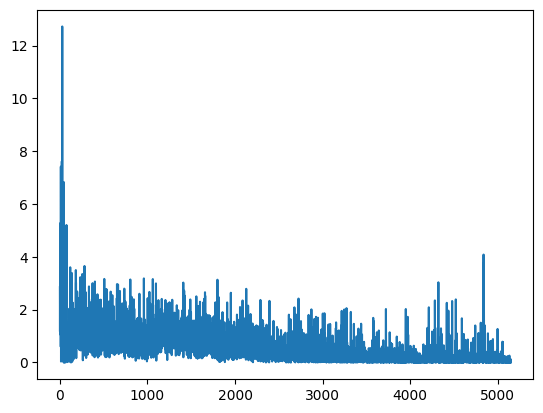

In [45]:
plt.plot(raw_lossesD)

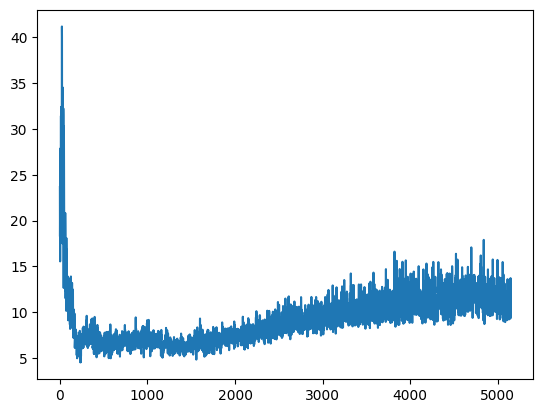

In [46]:
plt.plot(raw_lossesG)

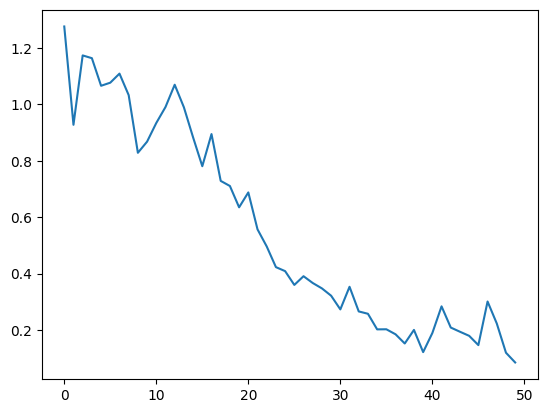

In [47]:
plt.plot(lossesD)

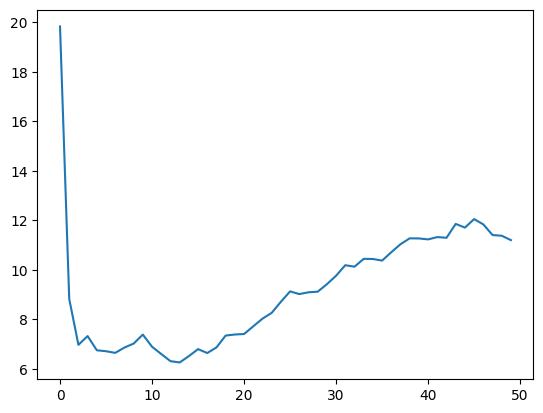

In [48]:
plt.plot(lossesG)

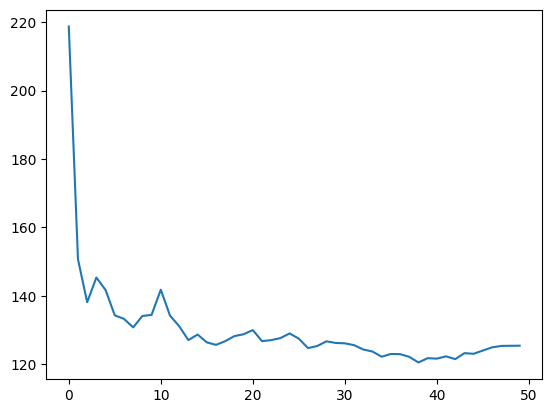

In [49]:
plt.plot(fid_)

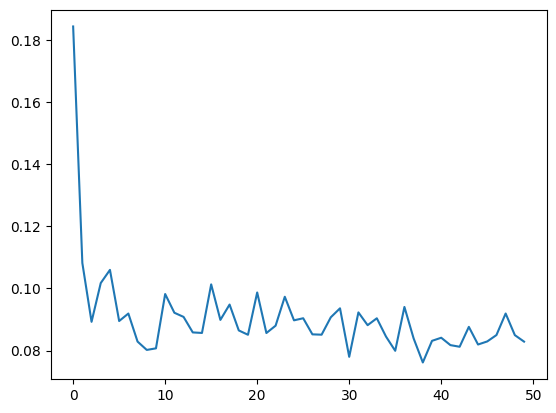

In [50]:
plt.plot(kid_mean_)

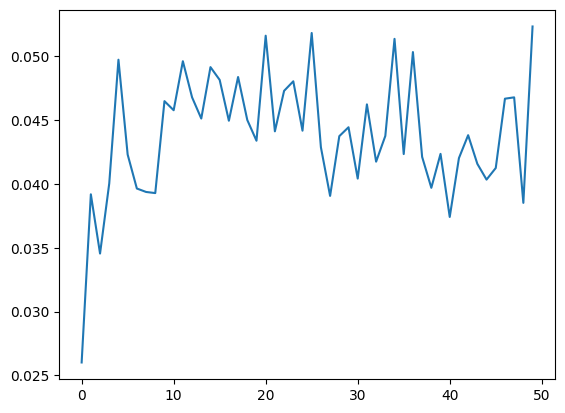

In [51]:
plt.plot(kid_std_)

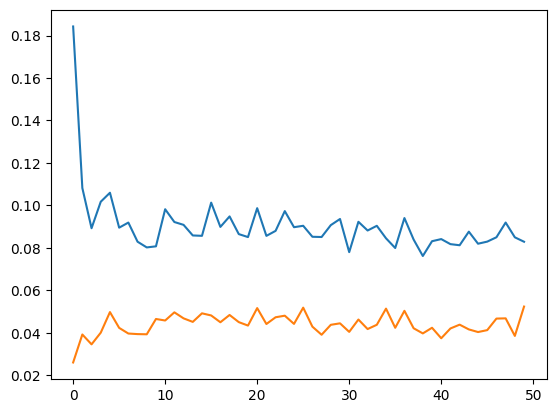

In [52]:
plt.plot(kid_score)

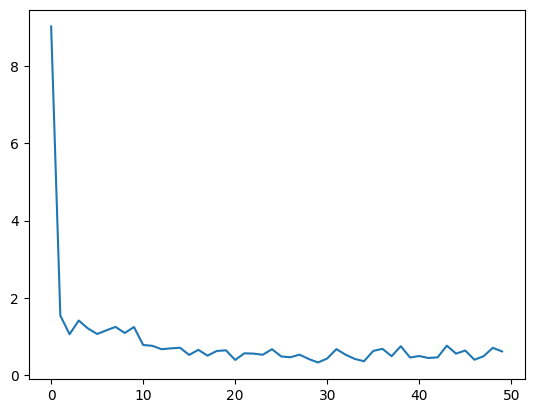

In [53]:
plt.plot(d_equality)

In [54]:

import torch
!pip install torcheval


from torcheval.metrics import PeakSignalNoiseRatio
import torch
import torchvision
#from torcheval.metrics import StructuralSimilarity

real_imgs = real_imgs.to(dtype=torch.uint8).cpu()
fake_imgs = fake_imgs.to(dtype=torch.uint8).cpu()
fid.update(real_imgs, real=True)
fid.update(fake_imgs, real=False)
print(f'fid ',fid.compute())

kid.update(real_imgs, real=True)
kid.update(fake_imgs, real=False)
print(f'kid ',kid.compute())

metric = PeakSignalNoiseRatio()
#input = torch.tensor([[0.1, 0.2], [0.3, 0.4]])
#>>> target = input * 0.9
metric.update(fake_imgs,real_imgs)
print(f'PSNR',metric.compute())#高いほどいい
#PSNR (Peak Signal-to-Noise Ratio): PSNRは、生成画像と本物の画像の間のノイズの量を測定します。高いPSNRは、より低いノイズレベルを示します。

import torch
from skimage.metrics import structural_similarity as ssim
import numpy as np

# 例えば、real_imageが与えられているとします
real_image =real_imgs # 仮のランダムな画像データ
fake_image =fake_imgs
# PyTorch TensorをNumPy配列に変換
real_image_np = real_image.cpu().numpy()

# SSIMを計算するために、0から1の範囲に正規化することが推奨されます
real_image_np = np.clip((real_image_np + 1) / 2.0, 0, 1)

# PyTorch TensorをNumPy配列に変換
fake_image_np = fake_image.cpu().numpy()

# SSIMを計算するために、0から1の範囲に正規化することが推奨されます
fake_image_np = np.clip((fake_image_np + 1) / 2.0, 0, 1)

# SSIMを計算
ssim_value = ssim(real_image_np[0], fake_image_np[0], win_size=3)
print(f"SSIM値: {ssim_value}")
#SSIMは、画像の品質を評価するための指標であり、生成画像と本物の画像の構造的な類似性を測定します。1に近い値が高い品質を示します。

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.2/179.2 kB 3.8 MB/s eta 0:00:00
fid  tensor(125.4272)
kid  (tensor(0.0828), tensor(0.0372))
PSNR tensor(71.4669)
SSIM値: 0.9796053362381829
